# AutoEncoder using PyTorch

An autoencoder is a type of artificial neural network used for unsupervised learning of efficient data codings. The aim of an autoencoder is to learn a compressed, distributed representation (encoding) for a set of data, typically for dimensionality reduction, data denoising, or feature learning. It consists of an encoder network that maps the input data into a latent space representation and a decoder network that reconstructs the input data from the latent representation.

It has two functions:


1.   Encoding function: Transforms the input data
2.   Decoding function: Recreates the input data from the encoded representation

Autoencoders can be used for various tasks such as dimensionality reduction, anomaly detection, image denoising, and generative modeling. Variants of autoencoders include sparse autoencoders, denoising autoencoders, variational autoencoders (VAEs), and convolutional autoencoders (CAEs), each with its own specific architecture and training objectives. <br>

![image.png](https://www.assemblyai.com/blog/content/images/2022/01/autoencoder_architecture.png)


## Let's install the necessary packages

In [ ]:
!pip install torch

In [ ]:
from matplotlib.pyplot import *
from random import sample
from re import split
import torch
import torchvision
from torch import device, no_grad
from torch.cuda import is_available
from torch.nn import Linear, Module, MSELoss, ReLU, Sequential, Sigmoid, Flatten
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST, CIFAR10
from torchvision.transforms import Compose, ToTensor
from torchvision.utils import make_grid

In [ ]:
import torch.nn.functional as F

We need to fit the size of the encoder and decoder. The Size of the Encoder is [28*28,400,200,50,25,6] and the Decoder size is set automatically.

In [ ]:
# Size of the hyperparameters
Encoder = [28*28,400,200,100,50,25,6]
Decoder = []

Learning_rate = 0.001
Epochs = 10

## Create a Class for Encoder and Decoder

This is how it works in the EMNIST Dataset <br>
![image.png](https://blog.keras.io/img/ae/autoencoder_schema.jpg)

In [ ]:
class Encoder(Module):
    def __init__(self, latent_dims):
        super(Encoder, self).__init__()
        self.linear1 = Linear(784, 512)
        self.linear2 = Linear(512, latent_dims)

    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        return self.linear2(x)

In [ ]:
class Decoder(Module):
    def __init__(self, latent_dims):
        super(Decoder, self).__init__()
        self.linear1 = Linear(latent_dims, 512)
        self.linear2 = Linear(512, 784)

    def forward(self, z):
        z = F.relu(self.linear1(z))
        z = torch.sigmoid(self.linear2(z))
        return z.reshape((-1, 1, 28, 28))

In [ ]:
class Autoencoder(Module):
    def __init__(self, latent_dims):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

## Let's train the Model

In [ ]:
# Let's train the network
def train(loader, model, optimizer,Epochs, dev = 'CPU'):
  Losses = []
  for epoch in range(Epochs):
    loss = 0
    for x, y in loader:
      x = x.to(dev)
      optimizer.zero_grad()
      x_hat = model(x)
      loss = ((x-x_hat)**2).sum()
      loss.backward()
      optimizer.step()
    Losses.append(loss/len(loader))
    print(f'epoch: {epoch+1}/{Epochs}, loss = {Losses[-1]:.6f}')
  return Losses

In [ ]:
#Let's prepare the data
latent_dims = 2
dev = device("cuda" if is_available() else "cpu")
model = Autoencoder(latent_dims).to(dev)
optimizer = Adam(model.parameters(), lr = Learning_rate)

## Let's import the Dataset

Here the first dataset is EMNIST. The EMNIST dataset, short for Extended MNIST, is an extension of the popular MNIST dataset, which stands for Modified National Institute of Standards and Technology database. EMNIST provides an extension to the MNIST dataset by including handwritten character digits and handwritten character letters. It is particularly useful for tasks involving character recognition. <br>

![image.png](https://greg-cohen.com/datasets/emnist/featured.png)

In [ ]:
# Let's import the Dataset
train_dataset = MNIST(root = "~/torch_datasets",
                      train = True,
                      transform = torchvision.transforms.ToTensor(),
                      download = True)
test_dataset = MNIST(root = "~/torch_datasets",
                      train = False,
                      transform = torchvision.transforms.ToTensor(),
                      download = True)
train_loader = DataLoader(train_dataset,
                          batch_size = 128,
                          shuffle = True,
                          num_workers = 4)
test_loader = DataLoader(test_dataset,
                         batch_size = 32,
                         shuffle = False,
                         num_workers = 4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


## Let's train the Model

In [ ]:
# Let's train the model
Losses = train(train_loader, model, optimizer, Epochs = Epochs, dev = dev)

epoch: 1/10, loss = 8.094974
epoch: 2/10, loss = 7.795502
epoch: 3/10, loss = 6.881248
epoch: 4/10, loss = 6.834270
epoch: 5/10, loss = 7.180246
epoch: 6/10, loss = 6.279310
epoch: 7/10, loss = 6.517162
epoch: 8/10, loss = 7.018091
epoch: 9/10, loss = 6.128614
epoch: 10/10, loss = 7.199149


## Plotting the Latent data and some of the testing images

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def plot_latent(autoencoder, data, num_batches = 100):
  for i, (x,y) in enumerate(data):
    z = Autoencoder
    z = z.to('cpu').detach().numpy()
    plt.scatter(z[:,0], Z[:,1], c= y, cmap='tab10')
    if i>num_batches:
      plt.colorbar()
      break

In [ ]:
plot_latent(model, train_loader)

## Let's reconstruct the images available in EMNIST Dataset

In [ ]:
def reconstruct(loader, model, Epochs = 10, prefix = 'test', show = False, figs = './figs', n_images = -1):
  def plot(original = None, decoded = None):
    fig = figure(figsize = (10,10))
    ax = fig.subplots(nrows = 2)
    ax[0].imshow(make_grid(original.view(-1,1,28,28)).permute(1,2,0))
    ax[0].set_title('Raw Images')
    scaled_decoded = decoded/decoded.max()
    ax[1].imshow(make_grid(scaled_decoded.view(-1,1,28,28)).permute(1,2,0))
    ax[1].set_title(f'Reconstructed images after {Epochs} epochs')
    # savefig(join(figs, f'{prefix}-comparison-{i}'))
    if not show:
      close(fig)

  samples = [] if n_images == -1 else sample(range(len(loader)//loader.batch_size), k = n_images)
  # print(samples)

  loss = 0.0
  with no_grad():
    for x, y in loader:
      count = 0
      for i,(batch_features, _) in enumerate(loader):
        x = x.to(dev)
        x_hat = model(x)
        loss = ((x-x_hat)**2).sum()
        if len(samples) == 0 or i in samples:
          plot(original = x, decoded = x_hat)
          count+=1
        if count>10:
          break
    Losses.append(loss/len(loader))
  return Losses

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
<ipython-input-54-fe368daca462>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = figure(figsize = (10,10))


KeyboardInterrupt: 

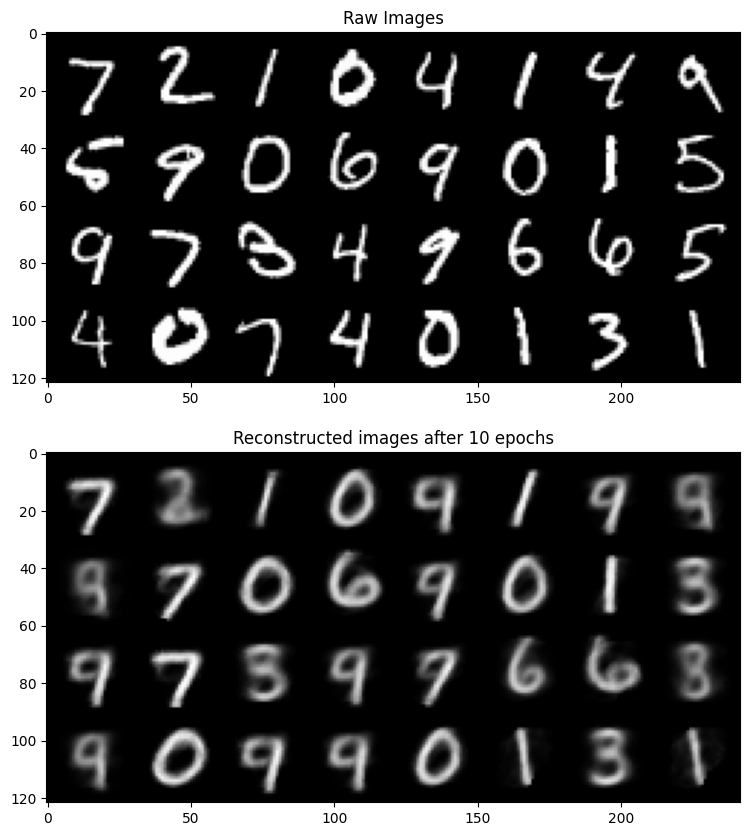

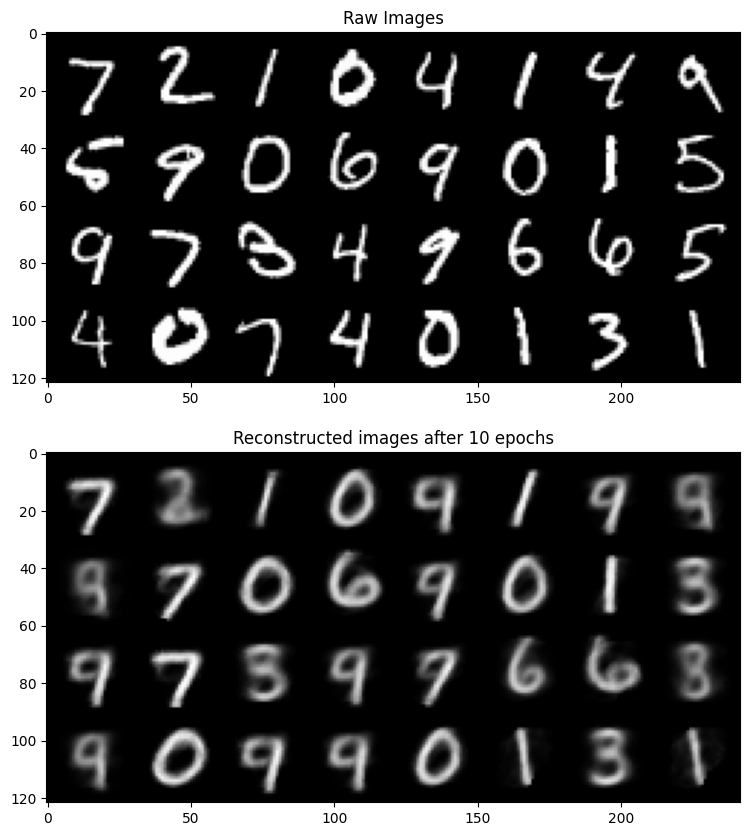

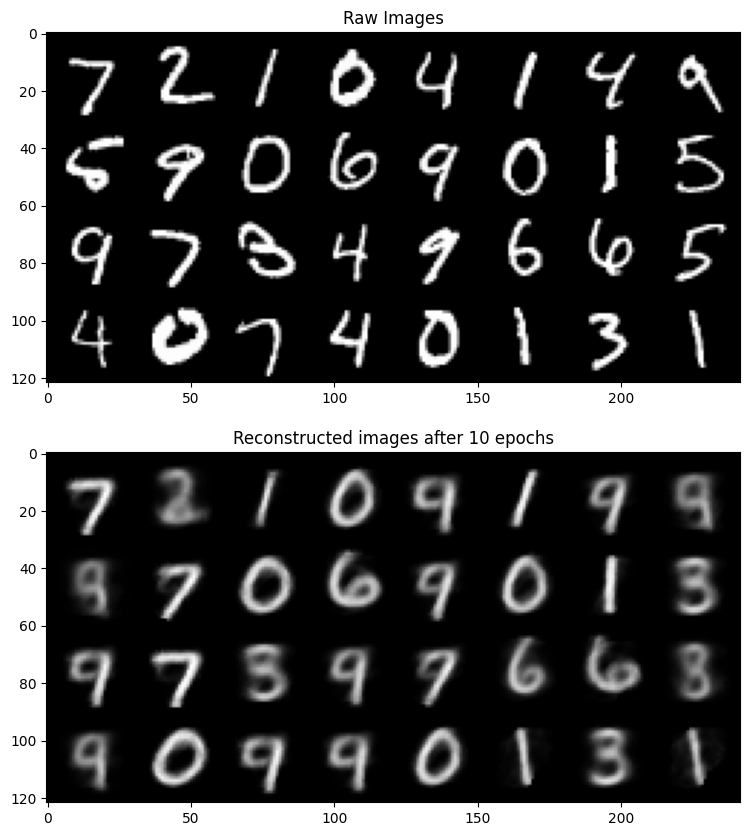

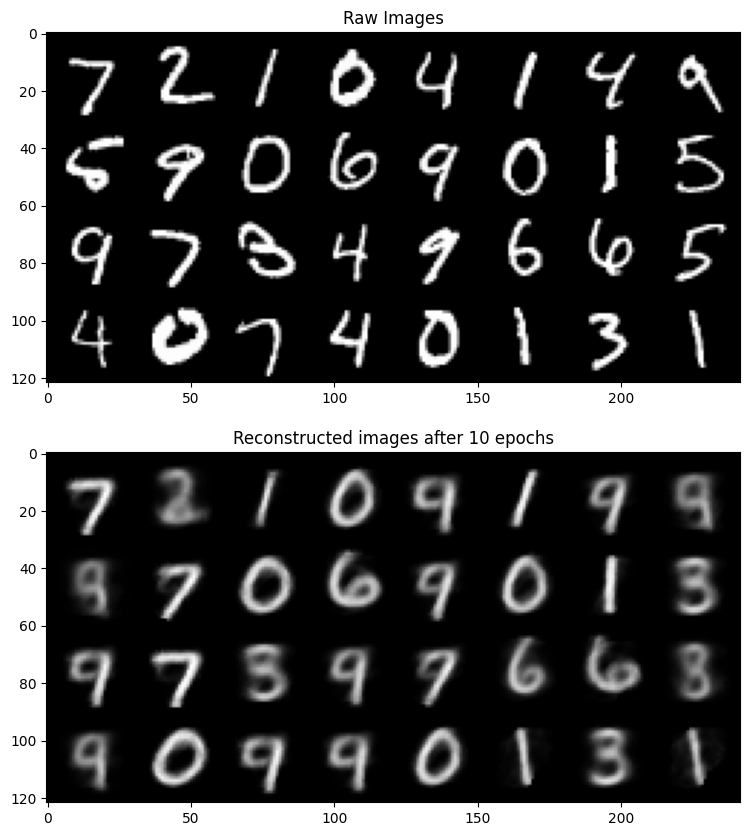

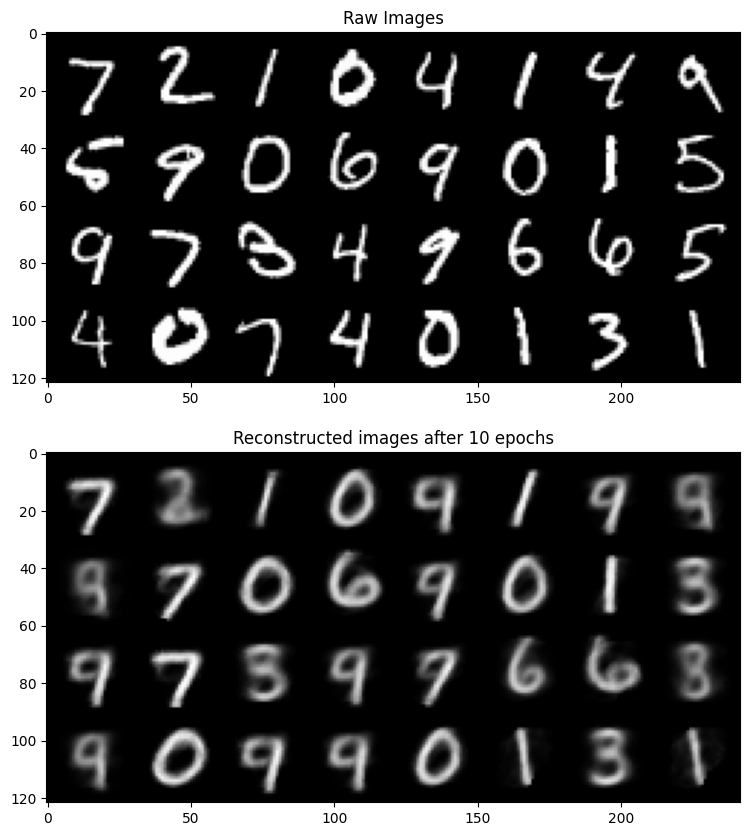

...

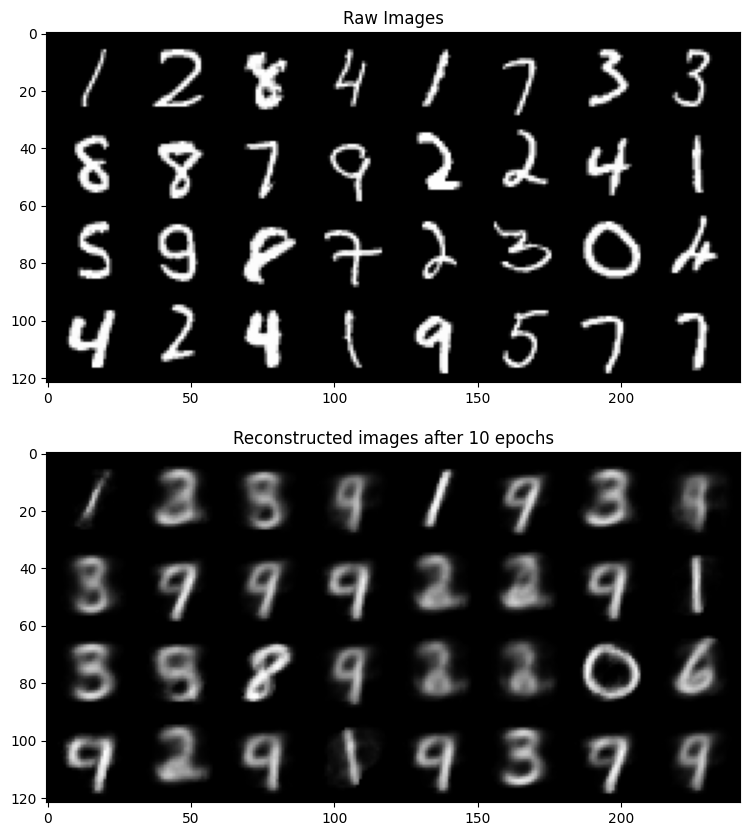

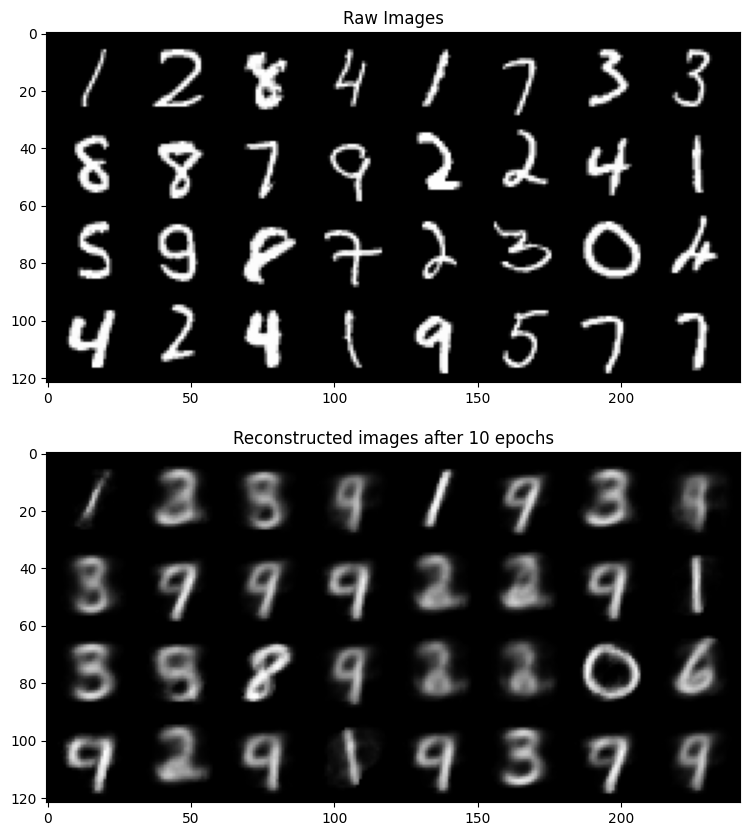

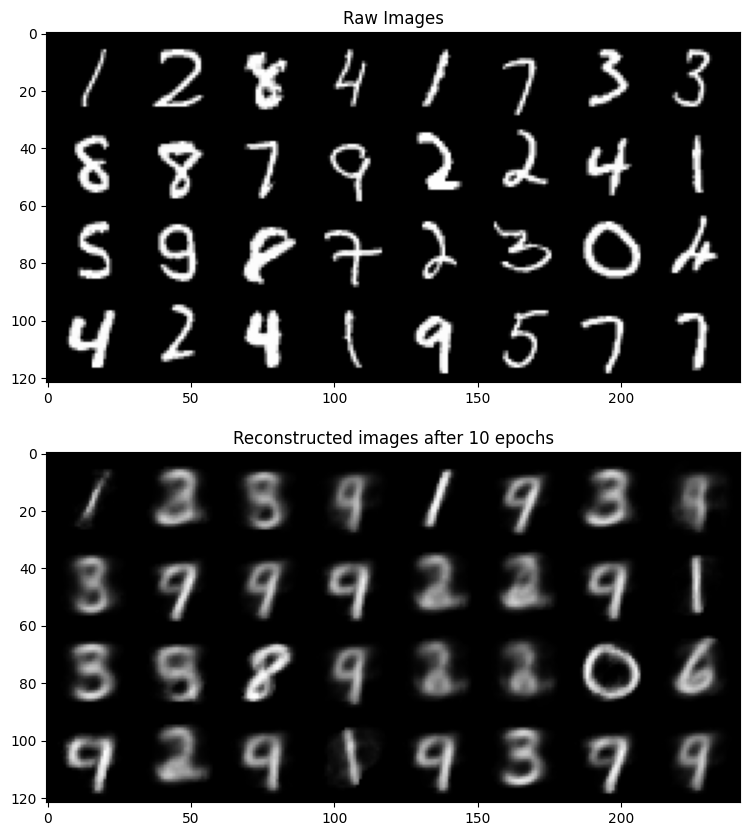

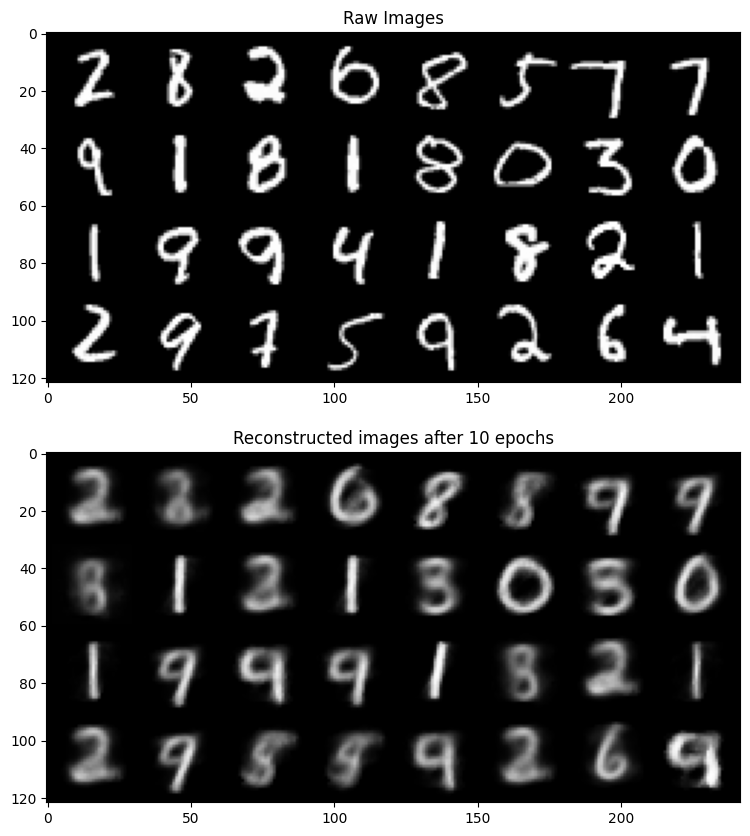

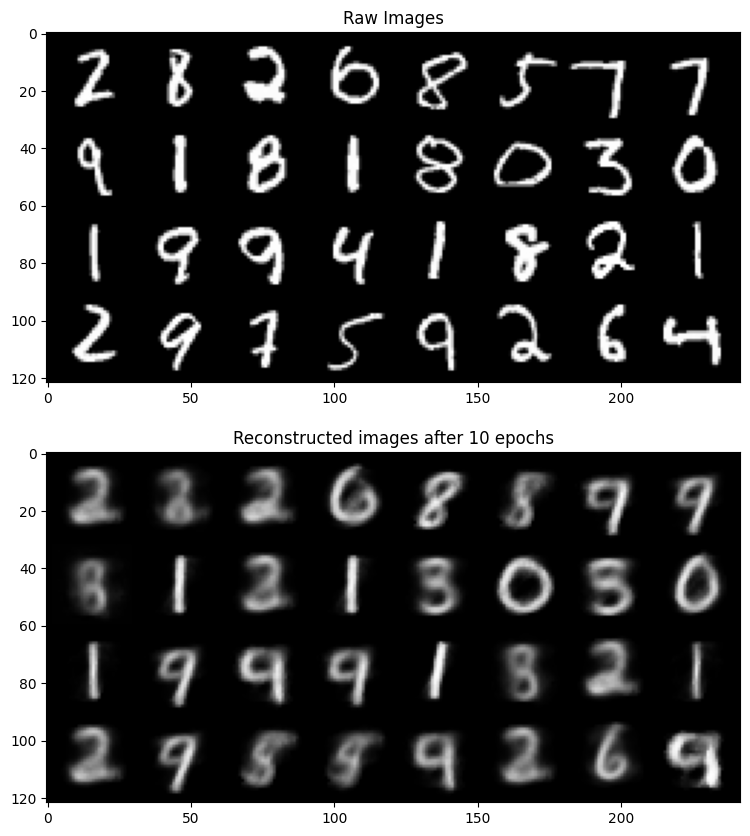

Error in callback <function flush_figures at 0x78ab0f624160> (for post_execute):


KeyboardInterrupt: 

In [ ]:
test_loss = reconstruct(test_loader, model, Epochs = Epochs, show = True, figs = '.', n_images = 5, prefix = 'foo')
print(test_loss)

In [ ]:
train_dataset = CIFAR10(root = "~/torch_datasets",
                      train = True,
                      transform = torchvision.transforms.ToTensor(),
                      download = True)
test_dataset = CIFAR10(root = "~/torch_datasets",
                      train = False,
                      transform = torchvision.transforms.ToTensor(),
                      download = True)
train_loader = DataLoader(train_dataset,
                          batch_size = 128,
                          shuffle = True,
                          num_workers = 4)
test_loader = DataLoader(test_dataset,
                         batch_size = 32,
                         shuffle = False,
                         num_workers = 4)

100%|██████████| 170498071/170498071 [00:04<00:00, 42163795.56it/s]


Extracting /root/torch_datasets/cifar-10-python.tar.gz to /root/torch_datasets
Files already downloaded and verified


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
Losses = train(train_loader, model, optimizer, Epochs = Epochs, dev = dev)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (128x3072 and 784x512)